# DNA/RNA Virus Toolklit

## Import needed Python libraries

In [1]:
from tqdm import tqdm
import time
import pandas as pd
import numpy as np
import random
from collections import Counter
import os, sys, traceback

from Bio import SeqIO
from Bio.Seq import Seq
from Bio.SeqUtils.ProtParam import ProteinAnalysis
from Bio.Alphabet import generic_dna

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.decomposition import TruncatedSVD

import nltk
from nltk.util import ngrams
from nltk import word_tokenize

plt.style.use('ggplot')

## Structures needed in genome analysis

In [2]:
nucleotides = ["A", "T", "C", "G"]
proteins = ['A','D','E','G','F','L','S','Y','C','W','L','P','H','Q','R','I','M','T','N','K','S','R','V']
complements = {"A": "T", "T": "A", "G": "C", "C": "G"}
uncertainties = ['W', 'U', 'S', 'M', 'K', 'R', 'Y', 'B', 'D', 'H', 'V', 'N', 'Z']


# using mRNA in lookup, not tRNA anti-codon
start_codons = ["ATG"]
stop_codons = ["TAA", "TAG", "TGA"]
dna_codons = {
    # 'M' - START, '_' - STOP
    "GCT": "A", "GCC": "A", "GCA": "A", "GCG": "A",
    "TGT": "C", "TGC": "C",
    "GAT": "D", "GAC": "D",
    "GAA": "E", "GAG": "E",
    "TTT": "F", "TTC": "F",
    "GGT": "G", "GGC": "G", "GGA": "G", "GGG": "G",
    "CAT": "H", "CAC": "H",
    "ATA": "I", "ATT": "I", "ATC": "I",
    "AAA": "K", "AAG": "K",
    "TTA": "L", "TTG": "L", "CTT": "L", "CTC": "L", "CTA": "L", "CTG": "L",
    "ATG": "M",
    "AAT": "N", "AAC": "N",
    "CCT": "P", "CCC": "P", "CCA": "P", "CCG": "P",
    "CAA": "Q", "CAG": "Q",
    "CGT": "R", "CGC": "R", "CGA": "R", "CGG": "R", "AGA": "R", "AGG": "R",
    "TCT": "S", "TCC": "S", "TCA": "S", "TCG": "S", "AGT": "S", "AGC": "S",
    "ACT": "T", "ACC": "T", "ACA": "T", "ACG": "T",
    "GTT": "V", "GTC": "V", "GTA": "V", "GTG": "V",
    "TGG": "W",
    "TAT": "Y", "TAC": "Y",
    "TAA": "_", "TAG": "_", "TGA": "_"
}

rna_codons = {
    # 'M' - START, '_' - STOP
    "GCU": "A", "GCC": "A", "GCA": "A", "GCG": "A",
    "UGU": "C", "UGC": "C",
    "GAU": "D", "GAC": "D",
    "GAA": "E", "GAG": "E",
    "UUU": "F", "UUC": "F",
    "GGU": "G", "GGC": "G", "GGA": "G", "GGG": "G",
    "CAU": "H", "CAC": "H",
    "AUA": "I", "AUU": "I", "AUC": "I",
    "AAA": "K", "AAG": "K",
    "UUA": "L", "UUG": "L", "CUU": "L", "CUC": "L", "CUA": "L", "CUG": "L",
    "AUG": "M",
    "AAU": "N", "AAC": "N",
    "CCU": "P", "CCC": "P", "CCA": "P", "CCG": "P",
    "CAA": "Q", "CAG": "Q",
    "CGU": "R", "CGC": "R", "CGA": "R", "CGG": "R", "AGA": "R", "AGG": "R",
    "UCU": "S", "UCC": "S", "UCA": "S", "UCG": "S", "AGU": "S", "AGC": "S",
    "ACU": "T", "ACC": "T", "ACA": "T", "ACG": "T",
    "GUU": "V", "GUC": "V", "GUA": "V", "GUG": "V",
    "UGG": "W",
    "UAU": "Y", "UAC": "Y",
    "UAA": "_", "UAG": "_", "UGA": "_"
}

BT006808_1 = "ATGGCCCTGTGGATGCGCCTCCTGCCCCTGCTGGCGCTGCTGGCCCTCTGGGGACCTGACCCAGCCGCAGCCTTTGTGAACCAACACCTGTGCGGCTCACACCTGGTGGAAGCTCTCTACCTAGTGTGCGGGGAACGAGGCTTCTTCTACACACCCAAGACCCGCCGGGAGGCAGAGGACCTGCAGGTGGGGCAGGTGGAGCTGGGCGGGGGCCCTGGTGCAGGCAGCCTGCAGCCCTTGGCCCTGGAGGGGTCCCTGCAGAAGCGTGGCATTGTGGAACAATGCTGTACCAGCATCTGCTCCCTCTACCAGCTGGAGAACTACTGCAACTAG"
MT324680_1 = "CAAKACTCACTTTCTTCCACAGCAAGTGCACTTGGAAAACTTCAAGATGTGGTCAACCAAAATGCACAAGCTTTAAACACGCTTGTTAAACAACTTAGCTCCAATTTTGGTGCAATTTCAAGTGTTTTAAATGATATCCTTTCACGTCTTGACAAAGTTGAGGCTGAAGTGCAAATTGATAGGTTGATCACAGGCAGACTTCAAAGTTTGCAGACATATGTGACTCAACAATTAATTAGAGCTGCAGAAATCAGAGCTTCTGCTAATCTTGCTGCTACTAAAATGTCAGAGTGTGTACTTGGACAATCAAAAAGAGTTGATTTTTGTGGAAAGGGCTATCATCTTATGTCCTTCCCTCAGTCAGCACCTCATGGTGTAGTCTTCTTGCATGTGACTTATGTCCCTGCACAAGAAAAGAACTTCACAACTGCTCCTGCCATTTGTCATGATGGAAAAGCACACTTTCCTCGTGAAGGTGTCTTTGTTTCAAA"

## Defined bioinformatic functions

In [3]:
def translateNucleotides(seq):
    seq = Seq(seq, generic_dna)
    translated_seq = str(seq.translate()).replace('*', '')
    clean_seq = ''.join([p for p in translated_seq if p in proteins])
    return clean_seq

In [4]:
def getVirusDf(fasta_data):
    try:
        ids = [] # accession id, searchable on NCBI
        descs = [] # text description of strain
        aa_percs = [] # ratio of amino acids in strain
        m_weights = [] # molecular weight
        a = [] # aromaticity
        ii = [] # instability index, > 40 means unstable / short half life .instability_index()
        n_seqs = [] # nuleotide sequence
        p_seqs = [] # translated protein sequence

        for record in tqdm(fasta_data):
            print(f'Processing {record.id} - {record.description}')
#             str_seq = cleanPlaceholderNucleotides(str(record.seq))
            str_seq = str(record.seq)
    
            # translated nucleotide string sequence
            p_seq = translateNucleotides(str_seq)
            ids.append(record.id)
            descs.append(record.description)
            
            # GC content
            gc_content = calcGcContent(str_seq)
            
            # protein analysis methods
            analysis = ProteinAnalysis(p_seq)
            aa_percs.append(analysis.get_amino_acids_percent())
            m_weights.append(analysis.molecular_weight())
            ii.append(analysis.instability_index())
            a.append(analysis.aromaticity())
            
            # nucleotide and protein string sequences
            n_seqs.append(str_seq)
            p_seqs.append(str(record.seq.translate()).replace('*', ' '))

        virus_df = pd.DataFrame({
            "ids": ids,
            "description": descs,
            "gc_content": gc_content,
            "amino_acid_percents": aa_percs,
            "molecular_weights": m_weights,
            "aromaticity": a,
            "instability_index": ii,
            "nucleotide_sequence": n_seqs,
            "protein_sequence": p_seqs
        })

        return virus_df
                  
    except Exception as e:
        print('-'*80)
        print(f"Exception in building virus datatframe: {e}")
        traceback.print_exc(file=sys.stdout)
        print('-'*80)

In [5]:
def proteinTranslation(x):
    return str(Seq(x).translate()).replace('*', ' ')

In [6]:
def proteinAnalysis(s):
    aa_percent, molecular_weight, instability_index, aromaticity = [], [], [], []
    for x in tqdm(s):
        protein_analysis = ProteinAnalysis(x.replace(' ', ''))
        aa_percent.append(protein_analysis.get_amino_acids_percent())
        molecular_weight.append(protein_analysis.molecular_weight())
        instability_index.append(protein_analysis.instability_index())
        aromaticity.append(protein_analysis.aromaticity())
    return aa_percent, molecular_weight, instability_index, aromaticity

In [7]:
# Filter outliers based on Seq Len ; probable reason to do this: The length will not change when Virus mutates within same family
def filterOutliers(df):
    q1 = df.seq_len.quantile(.25)
    q3 = df.seq_len.quantile(.75)
    iqr = q3 - q1
    
    lower_bound = q1 - iqr * 1.5
    upper_bound = q3 + iqr * 1.5
    
    print(f'Lower IQR bound: {lower_bound}, Upper IQR bound: {upper_bound}')
    
    return df[(df.seq_len<=upper_bound) & (df.seq_len>=lower_bound)].copy()

In [8]:
def removeStringBuffer(seq, i):
    out_seq = seq[:i-i%3] + seq[i+3-i%3:]
    return out_seq.replace('\n', '')

In [9]:
def cleanPlaceholderNucleotides(seq):
    k_pos = []
    for i in range(len(seq)):
        if seq[i] not in nucleotides:
            print(f'Found placeholder at {i}th nucleotide')
            k_pos.append(i)
    
    k_seq = seq
    if len(k_pos) > 0:
        for pos in k_pos:
            k_seq = removeStringBuffer(k_seq, pos)

    return k_seq[:(len(k_seq)-len(k_seq)%3)]

In [10]:
def buildAminoTriples(s):
    seq_list = []
    for i in range(0, len(s), 3):
        seq_list.append(s[i:i+3])
    return seq_list

In [11]:
def countNucleotides(seq):
#     a_num = seq.count('A')
#     t_num = seq.count('T')
#     c_num = seq.count('C')
#     g_num = seq.count('G')
#     gc_content = (c_num + g_num) / (c_num + g_num + a_num + c_num)
#     nuc_dict = {"A": a_num,
#                "T": t_num,
#                "C": c_num,
#                "G": g_num,
#                "GC": gc_content}
    nuc_dict = dict(Counter(seq))
    return nuc_dict

In [12]:
def validateString(seq):
    tmp_seq = seq.upper()
    for nuc in tmp_seq:
        if nuc not in nucleotides:
            return False
    return True

In [13]:
def generateRandomString(num_nucs):
    rand_seq = ''.join([random.choice(nucleotides) for nuc in range(num_nucs)])
    return rand_seq

In [14]:
def transcription(seq):
    return seq.replace("T", "U")

In [15]:
def reverseComplement(seq):
    return ''.join([complements[nuc] for nuc in seq])[::-1]

In [16]:
def calcGcContent(seq):
    return round((seq.count("C") + seq.count("G")) / len(seq) * 100, 3)

In [17]:
def subseqGcContent(seq, k=20):
    res = []
    for i in range(0, len(seq) - k + 1, k):
        subseq = seq[i:i + k]
        res.append(calcGcContent(subseq))
    return res

In [18]:
def translateSequence(seq, seq_type='dna', init_pos=0):
    if seq_type == 'dna':
        return [dna_codons[seq[pos:pos+3]] for pos in range(init_pos, len(seq) -2, 3)]
    elif seq_type == 'rna':
        return [rna_condons[seq[pos:pos+3]] for pos in range(init_pos, len(seq) -2, 3)]
    else:
        return ['invalid genome type provided']

In [19]:
def codonUsage(seq, aminoacid):
    codon_list = []
    for i in range(0, len(seq) - 2, 3):
        if dna_codons[seq[i:i + 3]] == aminoacid:
            codon_list.append(seq[i:i + 3])
            
    codon_frequencies = dict(Counter(codon_list))
    total_weight = sum(codon_frequencies.values())
    for seq in codon_frequencies:
        codon_frequencies[seq] = round(codon_frequencies[seq] / total_weight, 2)
    return codon_frequencies

In [20]:
def generateReadingFrames(seq):
    frames = []
    frames.append(translateSequence(seq, 'dna', 0))
    frames.append(translateSequence(seq, 'dna', 1))
    frames.append(translateSequence(seq, 'dna', 2))
    frames.append(translateSequence(reverseComplement(seq), 'dna', 0))
    frames.append(translateSequence(reverseComplement(seq), 'dna', 1))
    frames.append(translateSequence(reverseComplement(seq), 'dna', 2))
    return frames

In [21]:
def proteinsFromReadingFrame(amino_acids):
    current_protein = []
    proteins = []
    
    for amino_acid in amino_acids:
        if amino_acid == "_":
            if current_protein:
                for protein in current_protein:
                    proteins.append(protein)
                current_protein = []
        else:
            if amino_acid == "M":
                current_protein.append("")
            for i in range(len(current_protein)):
                current_protein[i] += amino_acid
    return proteins

In [22]:
def aggregateProteinsFromReadingFrames(seq, start_pos=0, end_pos=0, ordered=False):
    if end_pos > start_pos:
        reading_frames = generateReadingFrames(seq[start_pos: end_pos])
    else:
        reading_frames = generateReadingFrames(seq)
    
    result = []
    for frame in reading_frames:
        proteins = proteinsFromReadingFrame(frame)
        for protein in proteins:
            result.append(protein)
            
    if ordered:
        return sorted(result, key=len, reverse=True)
    return result

## Import CSV files of valid sequences

In [23]:
t1 = time.time()
non_vir_df = pd.read_csv('valid_non_virulent_sequences.csv')
vir_df = pd.read_csv('valid_virulent_sequences.csv')

print(f'Took {time.time() - t1} seconds to upload data files')

Took 7.857232093811035 seconds to upload data files


In [24]:
# give virulent df a categorical class, change to category type and add column for sequence length
vir_df['class'] = 'virulent'
vir_df['class'] = vir_df['class'].astype('category')
vir_df['seq_len'] = vir_df['seq_str'].apply(lambda x: len(x))

# give non-virulent df a categorical class, change to category type and add column for sequence length
non_vir_df['class'] = 'non-virulent'
non_vir_df['class'] = non_vir_df['class'].astype('category')
non_vir_df['seq_len'] = non_vir_df['seq_str'].apply(lambda x: len(x))

In [25]:
non_vir_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11442 entries, 0 to 11441
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   seq_id    11442 non-null  object  
 1   seq_name  11442 non-null  object  
 2   seq_desc  11442 non-null  object  
 3   seq_str   11442 non-null  object  
 4   class     11442 non-null  category
 5   seq_len   11442 non-null  int64   
dtypes: category(1), int64(1), object(4)
memory usage: 458.3+ KB


In [26]:
vir_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32893 entries, 0 to 32892
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   seq_id    32893 non-null  object  
 1   seq_name  32893 non-null  object  
 2   seq_desc  32893 non-null  object  
 3   seq_str   32893 non-null  object  
 4   class     32893 non-null  category
 5   seq_len   32893 non-null  int64   
dtypes: category(1), int64(1), object(4)
memory usage: 1.3+ MB


In [27]:
non_vir_df.head(10)

,seq_id,seq_name,seq_desc,seq_str,class,seq_len
0,MN734250.1,MN734250.1,MN734250.1 |Trichosanthes kirilowii dicistrovi...,CACTGGCAGAGAAAAAGACTGCCACTTCATGGTAGTGCATCAACTT...,non-virulent,8522
1,MN734251.1,MN734251.1,MN734251.1 |Trichosanthes kirilowii dicistrovi...,AAACGCCAGCAGGTTGTATATAGTCCTGTGGTTTAAGTTTCTGGTT...,non-virulent,8549
2,MN841300.1,MN841300.1,MN841300.1 |Ginkgo biloba dicistrovirus strain...,ACTGTGCGTTTTCCACGGGAAAGTAGCACACTATTTGACGGGGACG...,non-virulent,8934
3,MN841301.1,MN841301.1,MN841301.1 |Ginkgo biloba dicistrovirus strain...,CTCCGACTAAGAGGGCAAAAACAAATGCAGAAAGAAGTTTTCTGCA...,non-virulent,9293
4,MN841302.1,MN841302.1,MN841302.1 |Lactuca sativa dicistroviridae str...,CAATTGAGACTGTGGATCAAACGTTGGTTGCCAGTACATCTGGTGC...,non-virulent,8891
5,MN841303.1,MN841303.1,MN841303.1 |Lactuca sativa dicistroviridae str...,ATCCAGTTGTGTAAGACCCTTCGTAAAACGGGAGAACAGACTTTTA...,non-virulent,9133
6,MN862333.1,MN862333.1,MN862333.1 |Trichosanthes kirilowii gokushovir...,ATGGTGTCGGTGTCTTTCAAGCGAAGGAGCGGAAGCGATGAAGCGT...,non-virulent,4668
7,MN862334.1,MN862334.1,MN862334.1 |Trichosanthes kirilowii gokushovir...,ATGTCTTGCAACATGCCTATTGATTGCTATTATCGTGATGAGTTGA...,non-virulent,4756
8,MN862335.1,MN862335.1,MN862335.1 |Kummerowia striata gokushovirus st...,ATGGCGTGCTATCACCCGTTACGGGCCTATAGGCCCGATTCGGGTT...,non-virulent,4398
9,MN862336.1,MN862336.1,MN862336.1 |Kummerowia striata gokushovirus st...,ATGGCGTGTCAGGAACCTTCTGTTGCTGTCGTTATGCCCGGCATGA...,non-virulent,4497


In [28]:
vir_df.head(10)

,seq_id,seq_name,seq_desc,seq_str,class,seq_len
0,MT577359.1,MT577359.1,MT577359.1 |Severe acute respiratory syndrome ...,CAACCAACTTTCGATCTCTTGTAGATCTGTTCTCTAAACGAACTTT...,virulent,29816
1,MT582456.1,MT582456.1,MT582456.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782
2,MT582458.1,MT582458.1,MT582458.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782
3,MT582459.1,MT582459.1,MT582459.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782
4,MT582460.1,MT582460.1,MT582460.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782
5,MT582462.1,MT582462.1,MT582462.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782
6,MT582463.1,MT582463.1,MT582463.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782
7,MT582466.1,MT582466.1,MT582466.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782
8,MT582467.1,MT582467.1,MT582467.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782
9,MT582468.1,MT582468.1,MT582468.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782


## View distribution of length of DNA/RNA sequences

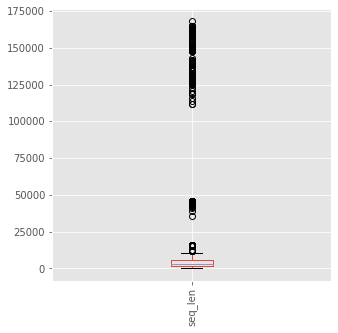

In [29]:
non_vir_df.seq_len.plot(kind='box', rot=90, figsize=(5,5))

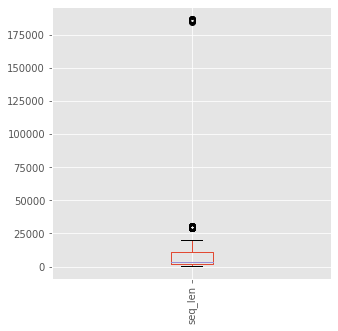

In [30]:
vir_df.seq_len.plot(kind='box', rot=90, figsize=(5,5))

In [31]:
print(len(vir_df.columns[vir_df.isnull().any()]))
print(len(non_vir_df.columns[non_vir_df.isnull().any()]))

0
0


## Sample and concatenate two dataframes

In [32]:
vir_df_sample = vir_df.sample(n=10000, weights='seq_len', random_state=42)
non_vir_df_sample = non_vir_df.sample(n=10000, weights='seq_len', random_state=42)

In [33]:
sample_df = pd.concat([vir_df_sample, non_vir_df_sample])
sample_df.reset_index(drop=True, inplace=True)

In [34]:
sample_df.head()

,seq_id,seq_name,seq_desc,seq_str,class,seq_len
0,KT749832.1,KT749832.1,KT749832.1 |Hepatitis B virus isolate FL10| co...,TTCCACTGCCTTCCACCAAGCTCTGCAGGATCCCAGAGTCAGGGGT...,virulent,3221
1,EF027134.1,EF027134.1,EF027134.1 |Chikungunya virus strain IND-06-AP...,GTAGCCTACCAGTTTCTTACTGCTCTACTCTGCAAAGCAAGAGATT...,virulent,11779
2,HQ332177.1,HQ332177.1,HQ332177.1 |Dengue virus 1 strain VE_61059_200...,AGTTGTTAGTCTACGTGGACCGACAAGAACAGTTTCGAATCGGAAG...,virulent,10735
3,KM677246.1,KM677246.1,KM677246.1 |Japanese encephalitis virus isolat...,AGAAGTTTATCTGTGTGAACTTCTTGACTTAGTATCGTTGAGAGGA...,virulent,10988
4,MT451602.1,MT451602.1,MT451602.1 |Severe acute respiratory syndrome ...,ACTTTCGATCTCTTGTAGATCTGTTCTCTAAACGAACTTTAAAATC...,virulent,29818


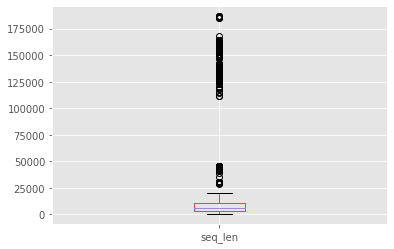

In [35]:
sample_df.seq_len.plot(kind='box')

In [36]:
merged_df = pd.concat([vir_df, non_vir_df])

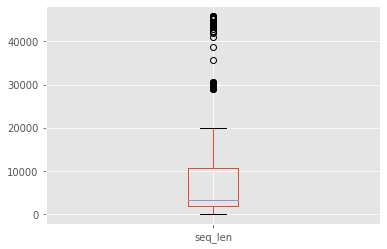

In [37]:
# filtered_df = filterOutliers(merged_df)
filtered_df = merged_df[merged_df.seq_len<=50000]
filtered_df.reset_index(drop=True, inplace=True)
filtered_df.seq_len.plot(kind='box')

In [38]:
filtered_df.head(20)

,seq_id,seq_name,seq_desc,seq_str,class,seq_len
0,MT577359.1,MT577359.1,MT577359.1 |Severe acute respiratory syndrome ...,CAACCAACTTTCGATCTCTTGTAGATCTGTTCTCTAAACGAACTTT...,virulent,29816
1,MT582456.1,MT582456.1,MT582456.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782
2,MT582458.1,MT582458.1,MT582458.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782
3,MT582459.1,MT582459.1,MT582459.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782
4,MT582460.1,MT582460.1,MT582460.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782
5,MT582462.1,MT582462.1,MT582462.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782
6,MT582463.1,MT582463.1,MT582463.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782
7,MT582466.1,MT582466.1,MT582466.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782
8,MT582467.1,MT582467.1,MT582467.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782
9,MT582468.1,MT582468.1,MT582468.1 |Severe acute respiratory syndrome ...,AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTC...,virulent,29782


## Reconstruct common protein analysis

In [39]:
t1 = time.time()
filtered_df['p_seq'] = filtered_df['seq_str'].apply(lambda x: proteinTranslation(x))
print(f'Took {time.time() - t1} seconds to translate nucleotides to proteins')

C:\Users\Modak\anaconda3\lib\site-packages\Bio\Seq.py:2859: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  BiopythonWarning,


Took 172.8191192150116 seconds to translate nucleotides to proteins


C:\Users\Modak\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [40]:
filtered_df['gc_content'] = filtered_df['seq_str'].apply(lambda x: calcGcContent(x))

C:\Users\Modak\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [41]:
filtered_df.rename(columns={'p_seq': 'protein_sequence', 'seq_str': 'nucleotide_sequence'}, inplace=True)

C:\Users\Modak\anaconda3\lib\site-packages\pandas\core\frame.py:4133: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [42]:
aa, mw, a, ii = np.apply_along_axis(proteinAnalysis, 0, filtered_df['protein_sequence'].values)
new_cols = ['amino_acid_percents','molecular_weights','aromaticity','instability_index']
filtered_df[new_cols] = pd.DataFrame({'amino_acid_percents': aa, 
                                      'molecular_weights': mw, 
                                      'aromaticity': a, 
                                      'instability_index': ii})

100%|██████████| 43995/43995 [08:18<00:00, 88.19it/s] 
C:\Users\Modak\anaconda3\lib\site-packages\pandas\core\frame.py:2963: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


In [43]:
filtered_df['seq_id'] = filtered_df['seq_id'].apply(lambda x: x.replace('.1', '').replace('.2', '').replace('.3', '').replace('.4', '').replace('.5', ''))

C:\Users\Modak\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [44]:
num_cols = ['molecular_weights', 'aromaticity', 'instability_index']
filtered_df[num_cols] = filtered_df[num_cols].astype('float')

In [45]:
filtered_df.set_index('seq_id', inplace=True)

In [46]:
amino_acids_percent_df = filtered_df['amino_acid_percents'].apply(pd.Series)
amino_acids_percent_df = amino_acids_percent_df.rename(columns = lambda x : 'amino_acid_' + str(x))


In [47]:
print(len(amino_acids_percent_df.columns[amino_acids_percent_df.isnull().any()]))

0


In [48]:
merged_df = filtered_df.loc[:, filtered_df.columns != 'amino_acid_percents'].merge(amino_acids_percent_df, left_index=True, right_index=True)

In [49]:
len(merged_df.columns[merged_df.isnull().any()])

0

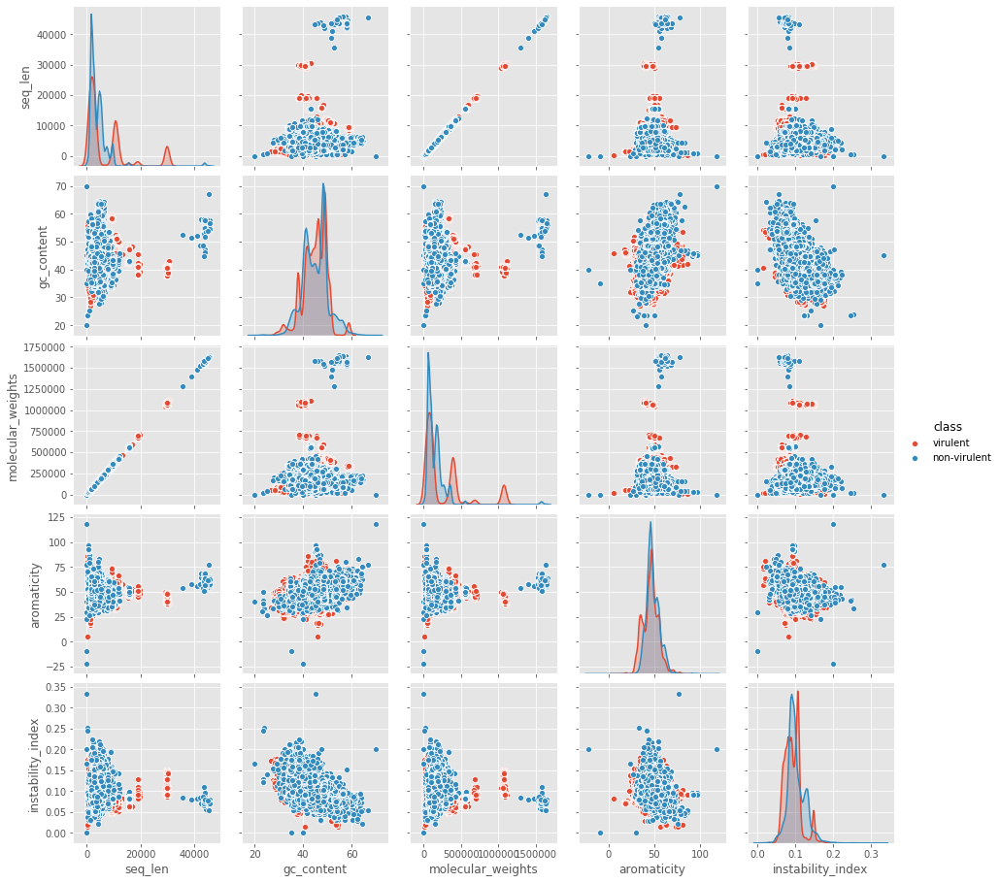

In [50]:
sns.pairplot(data=merged_df[['seq_len', 'gc_content', 'molecular_weights', 'aromaticity', 'instability_index', 'class']], hue='class')
plt.show()

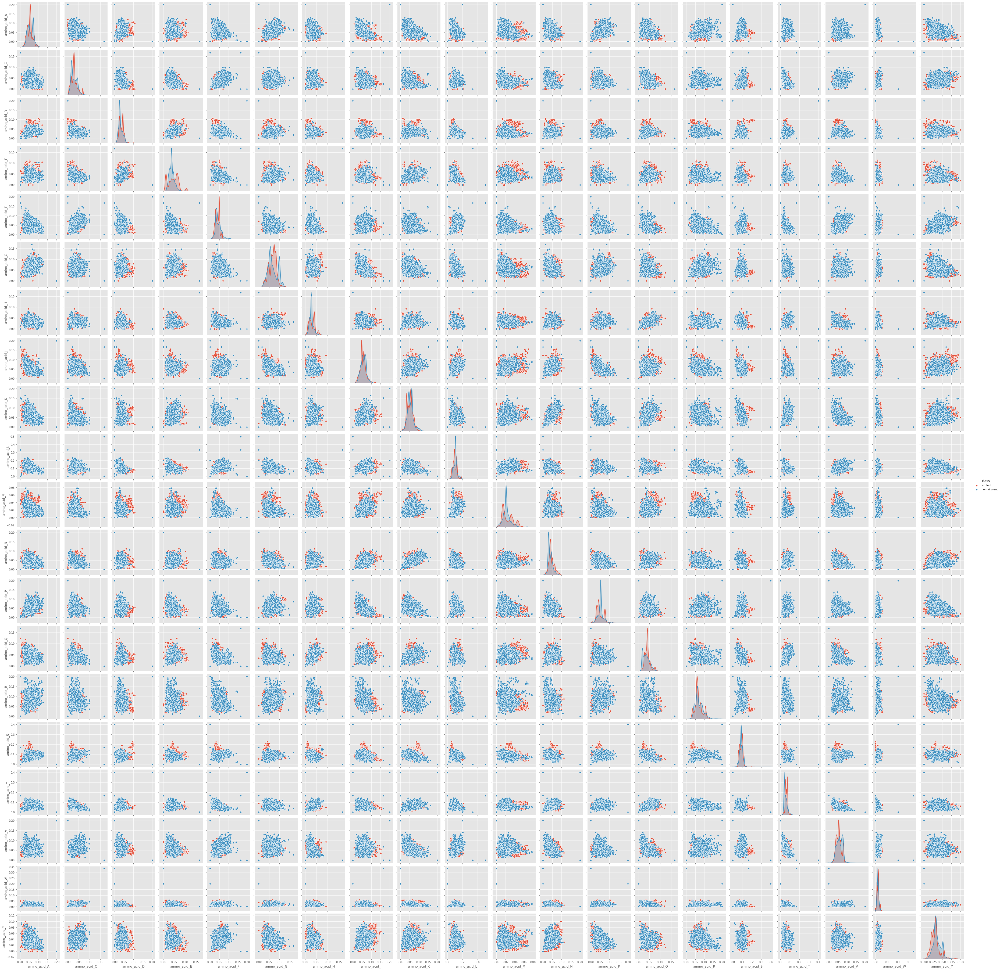

<Figure size 1440x1440 with 0 Axes>

In [51]:
#Takes time to execute
filter_cols = [col for col in merged_df if (col.startswith('amino_acid') or col == 'class')]
sns.pairplot(data=merged_df[filter_cols], hue='class')
plt.figure(figsize=(20,20))
plt.show()

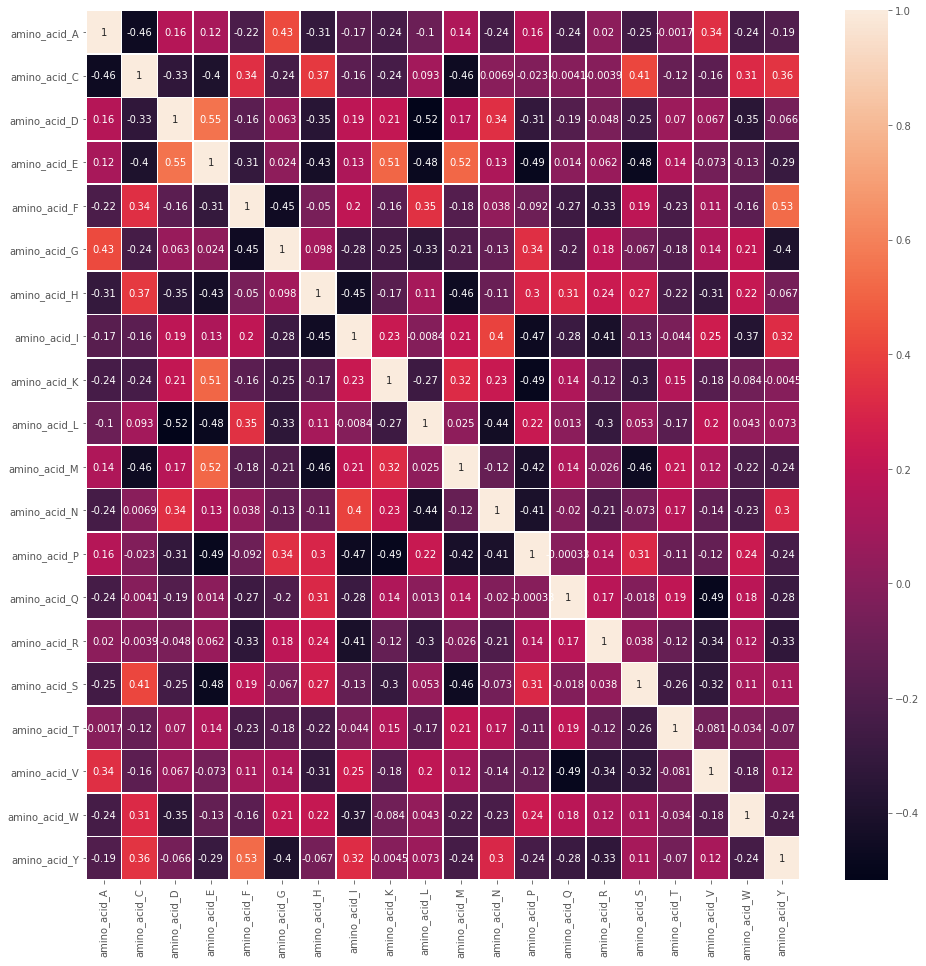

In [52]:
#Showing mutual information as heatmap with values
corr = amino_acids_percent_df.corr()
plt.figure(figsize = (16,16))
ax = sns.heatmap(corr,annot=True, linewidths=.5);

In [53]:
from sklearn.model_selection import train_test_split
#split dataset
y = merged_df["class"]
# All other columns will be used as features when training our model
X = merged_df.drop(["class"], axis=1, inplace=False)
# Split 70% of the data for training and leave out 30% for testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [54]:
X_train.head(10)

,seq_name,seq_desc,nucleotide_sequence,seq_len,protein_sequence,gc_content,molecular_weights,aromaticity,instability_index,amino_acid_A,...,amino_acid_M,amino_acid_N,amino_acid_P,amino_acid_Q,amino_acid_R,amino_acid_S,amino_acid_T,amino_acid_V,amino_acid_W,amino_acid_Y
seq_id,,,,,,,,,,,,,,,,,,,,,
FJ898464,FJ898464.1,FJ898464.1 |Dengue virus 3 isolate DENV-3/GY/B...,GACAAGAACAGTTTCGACTCGGAAGCTTGCTTAACGTAGTGCTAAC...,10663,DKNSFDSEACLT C QFFIREQISDEQPTEEDGKTVYQYAETREKP...,46.375,386335.0594,52.047296,0.076537,0.044031,...,0.016548,0.065603,0.041962,0.041076,0.107861,0.092790,0.057624,0.041667,0.026005,0.023936
JF706281,JF706281.1,JF706281.1 |Japanese encephalitis virus isolat...,AGAAGTTTATCTGTGTGAACTTCTTGGCTTAGTATCGTTGAGAAGA...,10965,RSLSV TSWLSIVEKNRKISAV TVF NGRTTMTKKPGGPGKNRAI...,51.856,402517.9198,33.972293,0.082120,0.081846,...,0.031035,0.035704,0.042845,0.027740,0.061796,0.059874,0.071134,0.082395,0.026916,0.023345
JX045969,JX045969.1,JX045969.1 |Influenza A virus (A/swine/Indiana...,ATGGATGTCAATCCGACTCTACTTTTCCTAAAGGTTCCAGCGCAAA...,2274,MDVNPTLLFLKVPAQNAISTTFPYTGDPPYSHGTGTGYTMDTVNRT...,42.304,86456.2288,41.538203,0.088507,0.052840,...,0.048877,0.063408,0.042272,0.040951,0.067371,0.070013,0.079260,0.046235,0.011889,0.033025
KX831480,KX831480.1,KX831480.1 |Porcine circovirus 2 isolate YiY-3...,ACCAGCGCACTTCGGCAGCGGCAGCACCTCGGCAGCACCTCAGCAG...,1767,TSALRQRQHLGSTSAATCPAKRMEEADPNHTKGGCSR IILPRTSA...,48.387,62338.1516,43.848348,0.089631,0.072056,...,0.021090,0.033392,0.052724,0.017575,0.061511,0.086116,0.042179,0.080844,0.021090,0.029877
KJ545440,KJ545440.1,KJ545440.1 |Dengue virus 4 isolate China/GD-D1...,CCTACGGAATGCGATGCGTAGGGGTAGGGAACAGAGACTTTGTGGA...,1517,PTECDA G GTETLWKESRVEHGSTWC NMEDASQPWPRENQPWIL...,45.485,53640.6414,53.173341,0.073753,0.036876,...,0.030369,0.028200,0.054230,0.067245,0.075922,0.073753,0.060738,0.043384,0.036876,0.013015
MH845344,MH845344.1,MH845344.1 |Epizootic hemorrhagic disease viru...,GTTAAAAAGGAGGCACGTTCTTGCATCATGGGCAAGATCATCAAGA...,1641,VKKEARSCIMGKIIKKLSKVGKKIGDALTSNTAQRIYKTIGKAAER...,45.826,61165.9438,44.102766,0.064103,0.102564,...,0.020147,0.023810,0.031136,0.047619,0.065934,0.053114,0.042125,0.056777,0.003663,0.031136
KC774197,KC774197.1,KC774197.1 |Hepatitis B virus isolate clz2035|...,CTCCACAACATTCCATCAAGCTCTGCTAGATCCCAGAGTGAGGGGC...,3215,LHNIPSSSARSQSEGPLFSCWWLQFRNSKPCSDYCLTHIVNLLEDW...,49.020,117546.9516,48.203718,0.108798,0.057711,...,0.016083,0.042573,0.076632,0.039735,0.057711,0.104068,0.053926,0.057711,0.026490,0.030274
EU939558,EU939558.1,EU939558.1 |Hepatitis B virus isolate C66| com...,TTCCACAACATTCCACCAAACGCTCCCTGCTGGTGGCTCCAGTTCC...,3185,FHNIPPNAPCWWLQFRNSKPCSDYCLTHIVNLIEDWGPCTEHGEHS...,49.294,116362.3280,47.605669,0.108987,0.059273,...,0.014340,0.043021,0.079350,0.038241,0.060229,0.102294,0.053537,0.054493,0.025813,0.031549
KM373995,KM373995.1,KM373995.1 |Influenza A virus (A/mallard/New J...,ATGGCGTCTCAAGGCACCAAACGATCCTATGAACAAATGGAAACTG...,1497,MASQGTKRSYEQMETGGERQNATEIRASVGRMVGGIGRFYIQMCTE...,47.695,56324.2248,45.132149,0.076305,0.078313,...,0.048193,0.054217,0.032129,0.044177,0.110442,0.076305,0.056225,0.044177,0.012048,0.028112


In [55]:
X_test.head(10)

,seq_name,seq_desc,nucleotide_sequence,seq_len,protein_sequence,gc_content,molecular_weights,aromaticity,instability_index,amino_acid_A,...,amino_acid_M,amino_acid_N,amino_acid_P,amino_acid_Q,amino_acid_R,amino_acid_S,amino_acid_T,amino_acid_V,amino_acid_W,amino_acid_Y
seq_id,,,,,,,,,,,,,,,,,,,,,
JN596938,JN596938.1,JN596938.1 |Influenza A virus (A/swine/Italy/4...,ATGGAGAGAATAAAAGAATTAAGGGATCTGATGTCGCAGTCTCGCA...,2291,MERIKELRDLMSQSRTREILTKTTVDHMAIIKKYTSGRQEKNPALR...,43.038,86193.5498,44.243045,0.065617,0.059055,...,0.043307,0.044619,0.036745,0.047244,0.080052,0.066929,0.070866,0.077428,0.013123,0.020997
MN233023,MN233023.1,MN233023.1 |Senecavirus A isolate CAN/07-50329...,GGGGGGCTGGGCCCTCATGCCCAGTCCTTCCTTTCCCCTTCCGGAG...,7304,GGLGPHAQSFLSPSGGLTGCVC RHRGATSNLLLRGTVRLRFLRRQ...,51.533,266865.1990,35.107498,0.098428,0.076510,...,0.020678,0.045906,0.069892,0.038048,0.050041,0.079818,0.070306,0.071133,0.012821,0.035153
KC762642,KC762642.1,KC762642.1 |Dengue virus 1 isolate MKS-WS88| c...,AGTTGTTAGTCTACGTGGACCGACAAGAACAGTTTCGAATCGGAAG...,10735,SC STWTDKNSFESEACLT F QFFIREQISDEQPTEKDGSTVFQY...,46.614,391770.4902,56.616210,0.069197,0.041460,...,0.018102,0.057226,0.047299,0.041460,0.109489,0.096058,0.060438,0.039416,0.026277,0.019562
MH622929,MH622929.2,MH622929.2 |Microviridae sp. isolate ctei769| ...,ATGCATCGCAATAAATCGGTAATGGTTCATCAATTCTCACGCGTGC...,4525,MHRNKSVMVHQFSRVPKAQIPRSSFDRSHGHKTTFDAGLLIPVFVD...,52.464,164309.0108,51.379014,0.068872,0.077650,...,0.020932,0.045240,0.076975,0.064821,0.070898,0.093180,0.091830,0.041864,0.008778,0.024983
EF210157,EF210157.2,EF210157.2 |Chikungunya virus strain DRDE-06| ...,ATGGCTGCGTGAGACACACGTAGCCTACCAGTTTCTTACTGCTCTA...,11774,MAA DTRSLPVSYCSTLQSKRLITHHGSCVRGHRR QRLFEGPATC...,50.204,423923.0353,55.161665,0.060101,0.064072,...,0.015091,0.041303,0.066984,0.047127,0.108552,0.074133,0.066190,0.064602,0.010061,0.032036
KJ598653,KJ598653.1,KJ598653.1 |UNVERIFIED: Hepatitis B virus isol...,TTCCACAACATTCCACCAAGCTCTGCTAGATCCCAGAGTGAGGGGC...,3197,FHNIPPSSARSQSEGPIFSCWWLQFRNSKPCSDYCLTHIVNLLEDW...,49.171,116600.8841,49.182869,0.107722,0.057197,...,0.014299,0.040991,0.079123,0.040038,0.057197,0.100095,0.057197,0.055291,0.021926,0.032412
KP739382,KP739382.1,KP739382.1 |Influenza A virus (A/chicken/Washi...,TCACTCACCGAGTGACATCCACATCATGGCGTCTCAAGGCACCAAA...,1524,SLTE HPHHGVSRHQTIL ANGNWWRTPECH NQSICWENGWWNRK...,47.638,55171.7606,64.972689,0.071429,0.046218,...,0.006303,0.054622,0.052521,0.058824,0.100840,0.096639,0.033613,0.023109,0.035714,0.012605
KR534251,KR534251.2,KR534251.2 |Rabies lyssavirus isolate RV2898| ...,ACGCTTAACAACAAAATCAGAGAAGAAGCAGAAAGCGTCAGTTGTA...,11923,TLNNKIREEAESVSCKTKM HPYNGCRQDCIQSQ SGGLFEA DYR...,45.467,418796.2265,54.944282,0.084027,0.030604,...,0.022819,0.027651,0.060403,0.043758,0.076242,0.113557,0.072483,0.043490,0.018792,0.028456
JQ319166,JQ319166.1,JQ319166.1 |Puumala virus strain PUUV/Konneves...,TAGTAGTAGACTCCTTGAAAAGCTACTACGAGAAAAACTGGAATGA...,1829,TP KATTRKTGMSDLTDIQEDITRHEQQLVVARQKLKDAERAV...,38.983,68139.1133,46.496667,0.095960,0.060606,...,0.035354,0.037037,0.045455,0.047138,0.062290,0.053872,0.063973,0.060606,0.008418,0.043771


In [56]:
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.feature_selection import SelectFromModel
X_train.shape  #(30796, 29)
X_train1= X_train[X_train.columns[~X_train.columns.isin(['seq_name','seq_desc','nucleotide_sequence','protein_sequence'])]]
clf = ExtraTreesClassifier(n_estimators=50)
clf = clf.fit(X_train1, y_train)
X_train1.shape
#clf.feature_importances_  
#model = SelectFromModel(clf, prefit=True)
#X_new = model.transform(X_train[X_train.columns[~X_train.columns.isin(['seq_name','seq_desc','nucleotide_sequence','protein_sequence'])]] )
#X_new.shape  

(30796, 25)

In [57]:
X_test1 = X_test[X_test.columns[~X_test.columns.isin(['seq_name','seq_desc','nucleotide_sequence','protein_sequence'])]]
score3= clf.score(X_test1, y_test)
score3

0.9987877869535571

In [58]:
print(X_test.iloc[1].values)
#print(X_test1.iloc[-1].values.reshape(1, -1))
print(y_test.iloc[1])

clf.predict(X_test1.iloc[1].values.reshape(1, -1))

['MN233023.1'
 'MN233023.1 |Senecavirus A isolate CAN/07-503297/2007| complete genome'
 'GGGGGGCTGGGCCCTCATGCCCAGTCCTTCCTTTCCCCTTCCGGAGGGTTAACCGGCTGTGTTTGCTAGAGGCACAGAGGGGCAACATCCAACCTGCTTTTGCGGGGAACGGTGCGGCTCCGATTCCTGCGTCGCCAAAGGTGTTAGCGCACCCAAACGGCGCATCTACCAATGCTATTGGTGTGGTCTGCGAGTTCTAGCCTACTCGTTTCTCCCCTATCCATTCACTCACTCACGAAAAGTGTGTTGTAACCACAAGATTTAGCCCCCGCACGAGATGTGCGATAACCGTAAGACTGACTCAAGCGCGGAAAGCGCTGTAACCACATGCTGTTAGTCCCTTTATGGCTGCAAGATGGCTATCCACCTCGGATCACTGAACTGGAGCTCGACCCTCCTTAGTAAGGGAACCGAGAGGCCTTCGTGCAACAAGCTCCGACACAGAGTCCACGTGATTGCTACCACCATGAGTACATGGTTCTCCCCTCTCGACCCAGGACTTCTTTTTGAATATCCACGGCTCGATCCAGAGGGTGGGGCATGATCCCCCTAGCATAGCGAGCTACAGCGGGAACTGTAGCTAGGCCTTAGCGTGCCTTGGATACTGCCTGATAGGGCGACGGCCTAGTCGTGTCGGTTCTATAGGTAGCACATACAAATATGCAGAACTCTCATTTTTCTTTCGATACAGCCTCTGGCACCTTTGAAGATGTAACCGGAACAAAAGTCAAGATCGTTGAATACCCCAGATCGGTGAACAATGGTGTTTACGATTCGTCCACTCATTTAGAGATACTGAACCTACAGGGTGAAATTGAAGTTTTAAGGTCTTTCAATGAATATCAAATTCGCGCCGCCAAACAACAACTCGGACTGGACATCGTGTACGAACTACAGGGTAATGTTCAGAC

array(['non-virulent'], dtype=object)

In [59]:
X_train1.columns

Index(['seq_len', 'gc_content', 'molecular_weights', 'aromaticity',
       'instability_index', 'amino_acid_A', 'amino_acid_C', 'amino_acid_D',
       'amino_acid_E', 'amino_acid_F', 'amino_acid_G', 'amino_acid_H',
       'amino_acid_I', 'amino_acid_K', 'amino_acid_L', 'amino_acid_M',
       'amino_acid_N', 'amino_acid_P', 'amino_acid_Q', 'amino_acid_R',
       'amino_acid_S', 'amino_acid_T', 'amino_acid_V', 'amino_acid_W',
       'amino_acid_Y'],
      dtype='object')

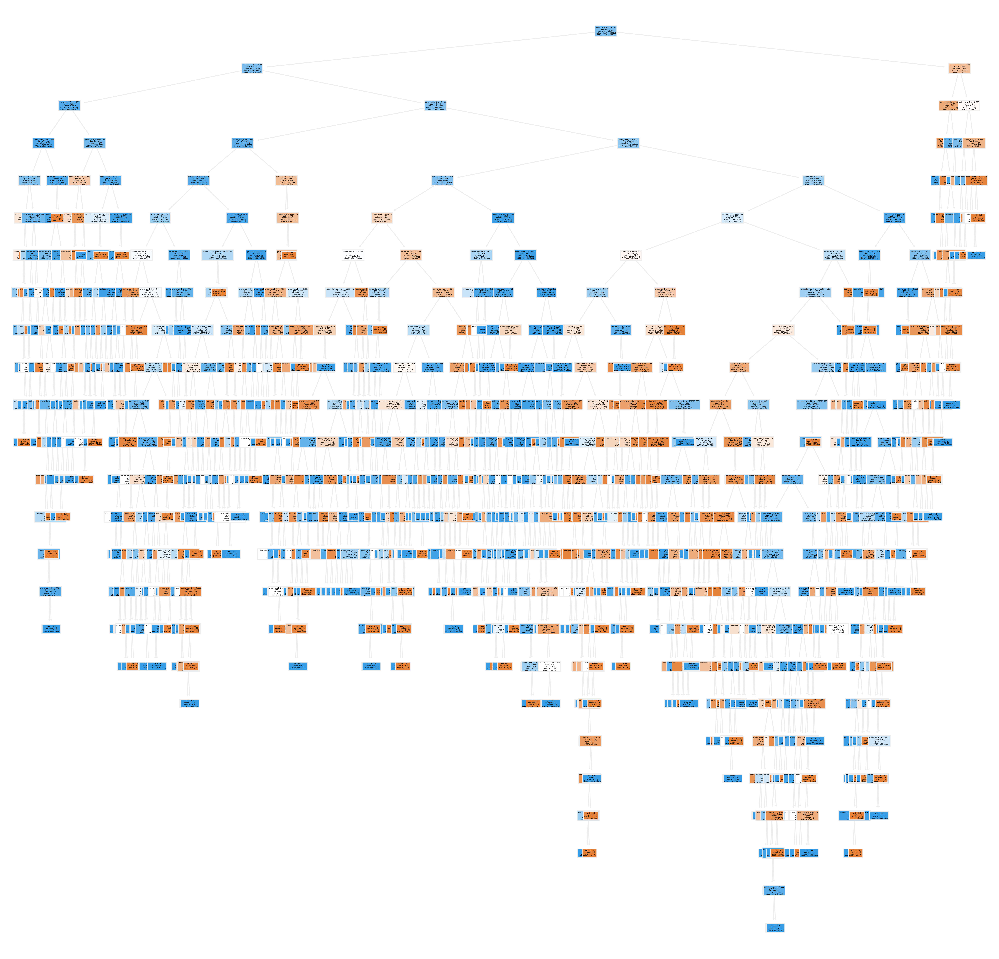

In [61]:
from sklearn import tree

fn=['seq_len', 'gc_content', 'molecular_weights', 'aromaticity',
       'instability_index', 'amino_acid_A', 'amino_acid_C', 'amino_acid_D',
       'amino_acid_E', 'amino_acid_F', 'amino_acid_G', 'amino_acid_H',
       'amino_acid_I', 'amino_acid_K', 'amino_acid_L', 'amino_acid_M',
       'amino_acid_N', 'amino_acid_P', 'amino_acid_Q', 'amino_acid_R',
       'amino_acid_S', 'amino_acid_T', 'amino_acid_V', 'amino_acid_W',
       'amino_acid_Y']
cn=['virulent','non-virulent']
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (10,10), dpi=800)
tree.plot_tree(clf.estimators_[0],
               feature_names = fn, 
               class_names=cn,
               filled = True);
fig.savefig('individualtree.png')

seq_len Score: 0.10923
gc_content Score: 0.02992
molecular_weights Score: 0.10726
aromaticity Score: 0.01770
instability_index Score: 0.03400
amino_acid_A Score: 0.02582
amino_acid_C Score: 0.03216
amino_acid_D Score: 0.03496
amino_acid_E Score: 0.06611
amino_acid_F Score: 0.03438
amino_acid_G Score: 0.03648
amino_acid_H Score: 0.03701
amino_acid_I Score: 0.02247
amino_acid_K Score: 0.02546
amino_acid_L Score: 0.03604
amino_acid_M Score: 0.04370
amino_acid_N Score: 0.04390
amino_acid_P Score: 0.04715
amino_acid_Q Score: 0.03814
amino_acid_R Score: 0.02679
amino_acid_S Score: 0.02616
amino_acid_T Score: 0.03531
amino_acid_V Score: 0.02928
amino_acid_W Score: 0.02170
amino_acid_Y Score: 0.03888


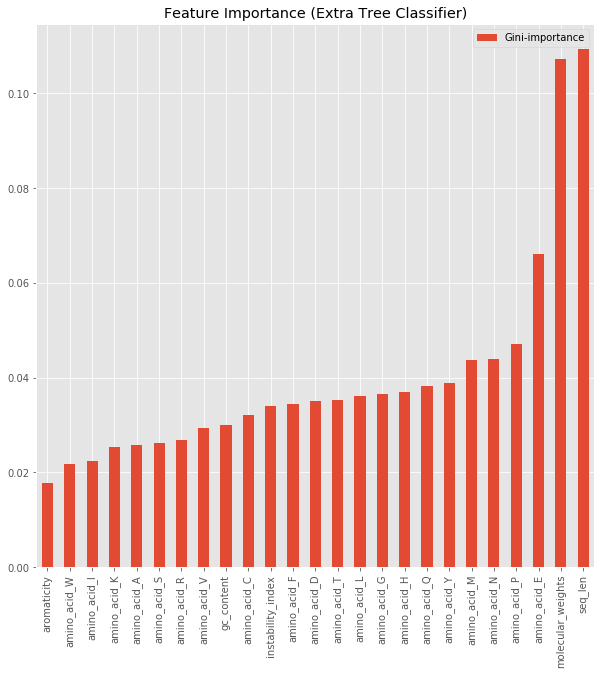

In [74]:
importance = clf.feature_importances_
feats = {}
# summarize feature importance
for i,v in zip(X_train1.columns,importance):
    feats[i] = v
    print(i,'Score: %.5f' % (v))
importances = pd.DataFrame.from_dict(feats, orient='index').rename(columns={0: 'Gini-importance'})
importances.sort_values(by='Gini-importance').plot(kind='bar', rot=90, figsize=(10,10), title = "Feature Importance (Extra Tree Classifier)")

In [77]:
from sklearn.model_selection import learning_curve
def plot_curve(lg, X,y):
    # instantiate

    # fit
    
    
    """
    Generate a simple plot of the test and traning learning curve.

    Parameters
    ----------
    estimator : object type that implements the "fit" and "predict" methods
        An object of that type which is cloned for each validation.

    title : string
        Title for the chart.

    X : array-like, shape (n_samples, n_features)
        Training vector, where n_samples is the number of samples and
        n_features is the number of features.

    y : array-like, shape (n_samples) or (n_samples, n_features), optional
        Target relative to X for classification or regression;
        None for unsupervised learning.

    ylim : tuple, shape (ymin, ymax), optional
        Defines minimum and maximum yvalues plotted.

    cv : integer, cross-validation generator, optional
        If an integer is passed, it is the number of folds (defaults to 3).
        Specific cross-validation objects can be passed, see
        sklearn.cross_validation module for the list of possible objects

    n_jobs : integer, optional
        Number of jobs to run in parallel (default 1).
        
    x1 = np.linspace(0, 10, 8, endpoint=True) produces
        8 evenly spaced points in the range 0 to 10
    """
    
    train_sizes, train_scores, test_scores = learning_curve(lg, X, y, cv = 5,n_jobs=-1, train_sizes=np.linspace(.1, 1.0, 5), verbose=0)

    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    
    plt.figure()
    plt.title("ExtraTreeClassifier")
    plt.legend(loc="best")
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    plt.gca().invert_yaxis()
    
    # box-like grid
    plt.grid()
    
    # plot the std deviation as a transparent range at each training set size
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.1, color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.1, color="g")
    
    # plot the average training and test score lines at each training set size
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")
    
    # sizes the window for readability and displays the plot
    # shows error from 0 to 1.1
    plt.ylim(-.1,1.1)
    plt.show()

No handles with labels found to put in legend.


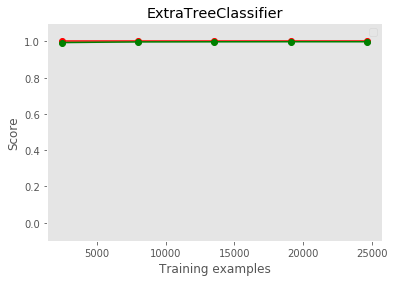

In [78]:
%matplotlib inline

plot_curve(clf,X_train1,y_train)

In [81]:
from sklearn.metrics import accuracy_score
X1 = X[X.columns[~X.columns.isin(['seq_name','seq_desc','nucleotide_sequence','protein_sequence'])]]
y_pred = clf.predict(X_test1)
print(accuracy_score(y_test, y_pred))

0.9987877869535571


In [82]:
X1.columns

Index(['seq_len', 'gc_content', 'molecular_weights', 'aromaticity',
       'instability_index', 'amino_acid_A', 'amino_acid_C', 'amino_acid_D',
       'amino_acid_E', 'amino_acid_F', 'amino_acid_G', 'amino_acid_H',
       'amino_acid_I', 'amino_acid_K', 'amino_acid_L', 'amino_acid_M',
       'amino_acid_N', 'amino_acid_P', 'amino_acid_Q', 'amino_acid_R',
       'amino_acid_S', 'amino_acid_T', 'amino_acid_V', 'amino_acid_W',
       'amino_acid_Y'],
      dtype='object')

In [83]:
from sklearn.metrics import confusion_matrix, roc_curve, auc, classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

non-virulent       1.00      1.00      1.00      3330
    virulent       1.00      1.00      1.00      9869

    accuracy                           1.00     13199
   macro avg       1.00      1.00      1.00     13199
weighted avg       1.00      1.00      1.00     13199



In [84]:
from sklearn.model_selection import cross_val_predict
predicted = cross_val_predict(clf, X_test1, y_test, cv=10)

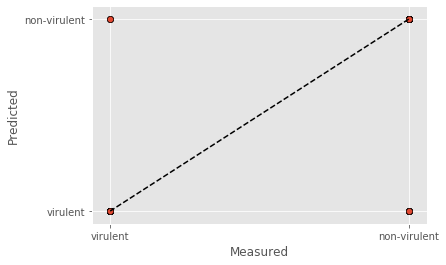

In [85]:
fig, ax = plt.subplots()
ax.scatter(y_test, predicted, edgecolors=(0, 0, 0))
ax.plot([y.min(), y.max()], [y.min(), y.max()], 'k--')
ax.set_xlabel('Measured')
ax.set_ylabel('Predicted')
plt.show()

In [86]:
import sklearn
import numpy
import joblib
print (sklearn.__version__)
print (numpy.__version__)
print (joblib.__version__)

0.23.0
1.16.0
0.14.1


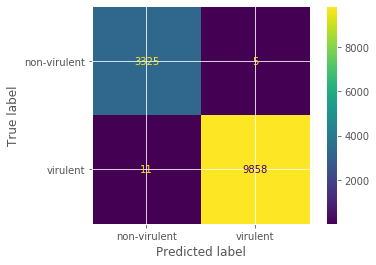

In [87]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(clf, X_test1, y_test)  # doctest: +SKIP
plt.show()

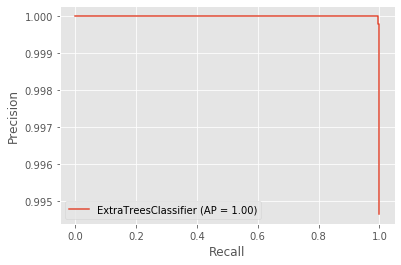

In [88]:
#A precision-recall curve shows the relationship between precision (= positive predictive value) and recall (= sensitivity) for every possible cut-off.
from sklearn.metrics import plot_precision_recall_curve
import matplotlib.pyplot as plt

disp = plot_precision_recall_curve(clf, X_test1, y_test)

In [89]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
def plot_roc_curve(fpr, tpr):
    plt.plot(fpr, tpr, color='orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()

In [90]:
#Predict probabilities for the test data.
probs = clf.predict_proba(X_test1)
#Keep Probabilities of the positive class only.
probs = probs[:, 1]
#Compute the AUC Score.
auc = roc_auc_score(y_test, probs)
print('AUC: %.2f' % auc)

AUC: 1.00


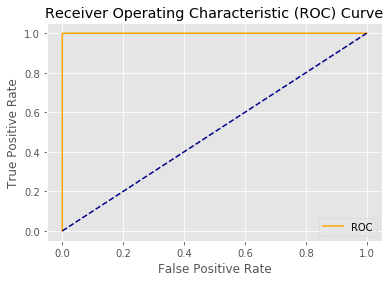

In [91]:
#probs
fpr, tpr, thresholds = roc_curve(y_test, probs,pos_label="virulent")
plot_roc_curve(fpr, tpr)


In [92]:
from sklearn.metrics import confusion_matrix, roc_curve, auc, classification_report

def plot_roc(X, y, models, model_names):
    plt.figure(0, figsize = [8, 7]).clf()
    plt.plot([0, 1], [0, 1], 'r--')
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    
    for ii, model in enumerate(models):
        y_prob = model.predict_proba(X)[:, 1]
        fpr, tpr, threshold = roc_curve(y, y_prob, pos_label ="virulent")
        roc_auc = auc(fpr, tpr)

        plt.plot(fpr, tpr, label = "{} AUC = {:0.2f}".format(model_names[ii], roc_auc))

    plt.legend(loc = 'lower right');

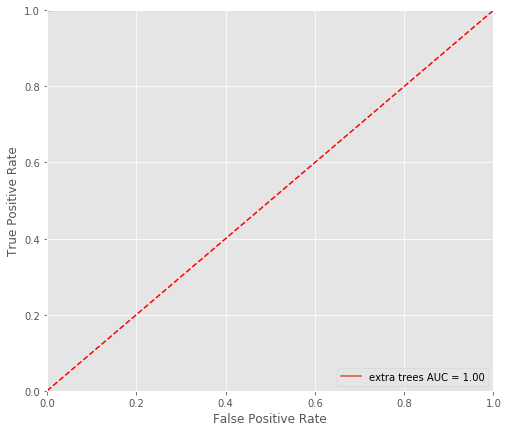

In [93]:
plot_roc(X_test1, y_test, [clf], ['extra trees'])

### Import metadata for pathogenic and nonpathogenic sequences

In [ ]:
vir_meta_df = pd.read_csv('pathogenic_sequences_table.csv')
non_vir_meta_df = pd.read_csv('non_pathogenic_sequences_table.csv')

In [ ]:
vir_meta_df.set_index('Accession', inplace=True)
vir_meta_df.info()

In [ ]:
non_vir_meta_df.set_index('Accession', inplace=True)
non_vir_meta_df.info()

In [ ]:
meta_df = pd.concat([vir_meta_df, non_vir_meta_df])

In [ ]:
filtered_df = filtered_df.merge(meta_df, how='left', left_index=True, right_index=True)

In [ ]:
filtered_df.to_csv('virus_analysis.csv')

In [ ]:
# clean_cols = [col for col in filtered_df.columns.tolist() if not col.__contains__('_x')]
# analysis_df = filtered_df[clean_cols].copy()
# clean_cols = [col.replace('_y', '') for col in clean_cols]
# analysis_df.columns = clean_cols
# analysis_df.head()

### Inspect feature distributions

In [ ]:
analysis_df = pd.read_csv('virus_analysis.csv')

In [ ]:
analysis_df.isnull().sum()

In [ ]:
analysis_df.drop('Isolation_Source', axis=1, inplace=True)

In [ ]:
# filtered_df.dropna(inplace=True)

In [ ]:
virus_names = analysis_df.Species.unique().tolist()

In [ ]:
virus_names

In [ ]:
analysis_df['Species'] = analysis_df['Species'].apply(lambda x: x.lower())

In [ ]:
virus_families = analysis_df.Family.unique().tolist()

In [ ]:
analysis_df.Family.value_counts()

In [ ]:
pd.crosstab(analysis_df['Family'], analysis_df['class'])

In [ ]:
def plotSequenceLenHistogram(df, bins, strain):
    df[(df['Species'].str.contains(strain))]['seq_len'].hist(bins=bins)
    plt.title(f'{strain} Protein Length Distribution')
    plt.show()

In [ ]:
virus_names = ['ebola', 'hanta', 'severe acute respiratory', 'influenza', 'rabies', 'dengue', 'hepatitis', 'hepacivirus', 'rota', 'chikungunya', 'west nile', 'zika', 'measles', 'middle east']

In [ ]:
for name in virus_names:
    plotSequenceLenHistogram(analysis_df, 50, name)

In [ ]:
analysis_df.describe()

In [ ]:
sns.pairplot(data=analysis_df[['seq_len', 'gc_content', 'molecular_weights', 'aromaticity', 'instability_index', 'class']], hue='class')
plt.show()

In [ ]:
analysis_df[(analysis_df['class']=='virulent')].seq_len.hist(bins=50)
#  & (analysis_df['seq_desc'].str.contains('complete')) & (analysis_df['seq_len']>= 10000)
plt.title('virulent')
plt.show()

In [ ]:
analysis_df[(analysis_df['class']=='non-virulent')].seq_len.hist(bins=50) 
#  & (analysis_df['seq_desc'].str.contains('complete')) & (analysis_df['seq_len'] <= 80000) & (analysis_df['seq_len']>= 10000)
plt.title('non-virulent')
plt.show()

In [ ]:
# analysis_df = pd.concat([
#     filtered_df[(filtered_df['class']=='virulent') & (filtered_df['seq_desc'].str.contains('complete')) & (filtered_df['seq_len']>= 10000)],
#     filtered_df[(filtered_df['class']=='non-virulent') & (filtered_df['seq_desc'].str.contains('complete')) & (filtered_df['seq_len'] <= 80000) & (filtered_df['seq_len']>= 10000)]
# ])

## Build TFIDF vectors to proten similarity clustering

In [ ]:
protein_corpus = analysis_df.protein_sequence.values

In [ ]:
t1 = time.time()

vectorizer = TfidfVectorizer(ngram_range=(1, 10), 
                             analyzer='word', norm='l2', 
                             max_features=1000, lowercase=False,
                             min_df=.01, max_df=.90)
protein_vectors = vectorizer.fit_transform(protein_corpus)

t2 = time.time()

print(f'Took {t2-t1:.3} seconds to build TFIDF vector')

In [ ]:
protein_vectors.shape

In [ ]:
vectorizer.get_feature_names()

In [ ]:
ids = analysis_df.reset_index().seq_id.values
classes = analysis_df['class'].values
species = analysis_df['Species'].values

num_cols = ['seq_len', 'gc_content', 'molecular_weights', 'aromaticity', 'instability_index']
numeric = analysis_df[num_cols].values

scaler = StandardScaler()
numeric_scaled = scaler.fit_transform(numeric)

vector_df = pd.DataFrame(protein_vectors.toarray())
vector_df['ids'] = ids
vector_df['class'] = classes
vector_df['species'] = species
vector_df[num_cols] = pd.DataFrame(numeric_scaled)

vector_df.set_index('ids', inplace=True)
vector_df.to_csv('analysis_vectors.csv')

## Cluster and Visualize COVID strains

### Clustering using Kmeans (optional)

In [ ]:
ssd = []

for i in range(1, 10):
    print(f'Building kmeans with {i+1} clusters')
    kmeans = KMeans(n_clusters=i+1)
    kmeans.fit(protein_vectors)
    ssd.append(kmeans.inertia_)

In [ ]:
#Plotting to find the number of clusters
plt.plot(range(1,10), ssd,'bx-')
plt.xlabel("No. of clusters")
plt.ylabel("Sum of Squared Distance") #sum of squares within clusters
plt.title("The Elbow Method showing the optimal Kmeans clusters\n")
plt.show()

In [ ]:
kmeans = KMeans(n_clusters=10)
kmeans.fit(protein_vectors)

In [ ]:
vector_df['cluster'] = kmeans.predict(protein_vectors)

### Dimensionality reduction using SVD

In [ ]:
protein_vectors.toarray().shape

In [ ]:
vector_df[num_cols].values.shape

In [ ]:
# svd_features = np.concatenate((protein_vectors.toarray(), vector_df[num_cols].values), axis=1) # with numeric features
svd_features = protein_vectors.toarray() # without numeric features

In [ ]:
svd = TruncatedSVD(n_components=2, random_state=42)
svd_matrix = svd.fit_transform(svd_features)

In [ ]:
vector_df['svd_1'] = svd_matrix[:, 0]
vector_df['svd_2'] = svd_matrix[:, 1]

In [ ]:
vector_df[['svd_1', 'svd_2', 'species', 'class']]

In [ ]:
vector_df.shape[0]

In [ ]:
import plotly.express as px
fig = px.scatter(vector_df.reset_index(), x="svd_1", y="svd_2", color="class", opacity=.25,
                 hover_data=['class', 'ids', 'species'], color_continuous_scale=px.colors.sequential.Viridis)
fig.show()

In [ ]:
from sklearn.cluster import AgglomerativeClustering
X_vect = vector_df[['svd_1', 'svd_2', 'svd_3', 'cluster']].copy()

model = AgglomerativeClustering(n_clusters=n_species)
model = model.fit(X_vect)